In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0, '../..')

import numpy as np
import src.viz_utils as viz_utils
import importlib
from src.utils import CanonPart, CanonPartMetadata, get_pointcloud_in_cam_frame, transform_cloud_to_base, remove_outliers, pos_quat_to_transform, project_3d_bounding_box
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from torchvision import transforms
from PIL import Image
import torch
from src.seg_utils import *
import open3d as o3d
import open3d.visualization.gui as gui
import copy as cp
import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from pytorch_lightning import seed_everything


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


pybullet build time: May 20 2022 19:45:31


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
img_input_resize_size = 672

dm = Dinov2Matcher(device=device, repo_name="facebookresearch/dinov2", model_name="dinov2_vitg14", img_input_size=img_input_resize_size)

Using cache found in /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main
WARNING - 2025-01-31 23:42:47,711 - warnings - /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")

WARNING - 2025-01-31 23:42:47,714 - warnings - /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")

WARNING - 2025-01-31 23:42:47,717 - warnings - /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")

INFO - 2025-01-31 23:42:47,733 - vision_transformer - using SwiGLU layer as FFN


672


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sam_checkpoint = '/home/rthomp12/ObjectPartSeg/sam_vit_h_4b8939.pth'  # Path to the SAM checkpoint
sam_predictor = load_sam(sam_checkpoint,device)

In [4]:
# Load OWLv2.
import torch
from transformers import Owlv2Processor, Owlv2ForObjectDetection
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO

# Load the model and processor
# options: google/owlv2-large-patch14, google/owlv2-large-patch14-ensemble,
# google/owlv2-large-patch14, google/owlv2-base-patch16, google/owlv2-base-patch16-ensemble
owl_model_name = "google/owlv2-base-patch16"  # TODO: Select "-ensemble" for a stronger model.
owl_model = Owlv2ForObjectDetection.from_pretrained(owl_model_name)#.to("cuda")
owl_processor = Owlv2Processor.from_pretrained(owl_model_name)

KeyboardInterrupt: 

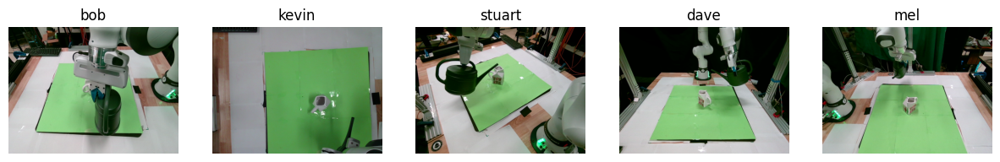

In [ ]:
#Load the files and camera information
root_file = "/home/rthomp12/fewshot/scripts/experiment_notebooks/watercan_on_mug_test_20250115-001228_darkgreen_teapot_tall_mug"
data_file = f'{root_file}/initial_scene.npy'

# Load recorded demo transformation
transform_name = f"{root_file}/ee_transform.npz"
demo_transform = np.load(transform_name)

init_transform = pos_quat_to_transform(demo_transform['init_pos'],
                                             demo_transform['init_quat'])

initial_scene = np.load(data_file, allow_pickle=True).item()
camera_names = initial_scene['cam_names']
camera_names.remove('kevin') # Poor results so we exclude it 

parent_demo_camera = 'dave'
child_demo_camera = 'mel'
#test_cameras = camera_names[:demo_index] + camera_names[demo_index+1:]

rgb_images = initial_scene['rgbs']
depth_images = initial_scene['depths']
intrinsics = initial_scene['intrinsic']
extrinsics = initial_scene['extrinsic']
crops = {'child': {}, 'parent': {}}
crop_coords = {'child': {}, 'parent': {}}
centroids =  {'child': {}, 'parent': {}}

scale = 3
plt.figure(figsize=(scale * len(rgb_images.keys()), scale))
for i, key in enumerate(rgb_images.keys()):
  plt.subplot(1, len(rgb_images.keys()), 1 + i)
  plt.title(key)
  plt.imshow(rgb_images[key])
  plt.axis("off")
plt.show()

In [ ]:
#Experiment data
#Select the experiment type 

# # Mug v Rack

# whole = False
# parent_part_names = ['trunk', 'branch']
# child_part_names = ['cup', 'handle']


# parent_part_model_files = {'trunk': '/home/rthomp12/fewshot/part_based_warp_models/trunk_dict_20240412-042732', 
#                            'branch': '/home/rthomp12/fewshot/part_based_warp_models/branch_dict_20240412-042732'}

# child_part_model_files = {'cup': '/home/rthomp12/fewshot/part_based_warp_models/cup_dict_20240202-160637',
#                           'handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20240202-160637'}
# # # parent_object = "mug tree"
# # # parent_object = "tree for hanging mugs"
# # # parent_object = "small brown tree"
# parent_object = "wooden stick"

# #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~Teapot v Mug

whole = False
parent_part_names = ['cup', 'handle']
child_part_names = ['body', 'spout', 'lid']

parent_part_model_files = {'cup': '/home/rthomp12/fewshot/mug_cup_20250103-220631_5',
                           'handle': '/home/rthomp12/fewshot/mug_handle_20250103-220631_5'}
child_part_model_files = {'body': '/home/rthomp12/fewshot/part_based_warp_models/body_dict_20241031-012841_5', 
                          'lid': '/home/rthomp12/fewshot/part_based_warp_models/lid_dict_20241031-012841_5',
                          'spout': '/home/rthomp12/fewshot/part_based_warp_models/spout_dict_20241031-012841_5',
                          'tea_handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20241031-012841_5', }

parent_object = "mug"


# #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Mug v Watering Can

# whole = False
# parent_part_names = ['cup', 'handle']
# child_part_names = ['body', 'tea_handle', 'spout', ]

# parent_part_model_files = {'cup': '/home/rthomp12/fewshot/mug_cup_20250103-220631_5',
#                            'handle': '/home/rthomp12/fewshot/mug_handle_20250103-220631_5'}
# child_part_model_files = {'body': '/home/rthomp12/fewshot/part_based_warp_models/body_dict_20241031-012841_5', 
#                           'spout': '/home/rthomp12/fewshot/part_based_warp_models/spout_dict_20241031-012841_5',
#                           'tea_handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20241031-012841_5', }

# parent_object = "mug"

# # Bowl v Mug

# whole = False
# parent_part_names = ['cup', 'handle']
# child_part_names = ['whole_bowl']

# parent_part_model_files = {'cup': '/home/rthomp12/fewshot/part_based_warp_models/cup_dict_20240202-160637',
#                           'handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20240202-160637'}
# child_part_model_files = {'whole_bowl': '/home/rthomp12/fewshot/part_based_warp_models/whole_bowl_20240426-000022_10'}

# parent_object = "mug"

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Whole Objects ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# whole=True
# # Mug v Rack
# parent_part_names = ['tree']
# child_part_names = ['mug']


# parent_part_model_files = {'tree': '/home/rthomp12/fewshot/part_based_warp_models/whole_syn_rack_easy_20240412-042732',}

# child_part_model_files = {'mug': '/home/rthomp12/fewshot/whole_mug_20240502-182007_6',}
# # parent_object = "mug tree"
# # parent_object = "tree for hanging mugs"
# # parent_object = "small brown tree"
# parent_object = "wooden stick"

# whole = True
# parent_part_names = ['mug']
# child_part_names = ['whole_teapot']

# parent_part_model_files = {'mug': '/home/rthomp12/fewshot/whole_mug_20240502-182007_6',}
# child_part_model_files = {'whole_teapot': None}

# parent_object = "mug"


# #~~~~~~~~~~~~~~~~~~~~~~~ Bowl V Mug

# whole=True
# parent_part_names = ['mug']
# child_part_names = ['whole_bowl']


# parent_part_model_files = {'mug': '/home/rthomp12/fewshot/whole_mug_20240502-182007_6',}

# child_part_model_files = {'whole_bowl': '/home/rthomp12/fewshot/part_based_warp_models/whole_bowl_20240426-000022_10'}

# parent_object = "mug"


# parent_part_models = {part: CanonPart.from_pickle(parent_part_model_files[part]) for part in parent_part_names}
# child_part_models = {part: CanonPart.from_pickle(child_part_model_files[part]) for part in child_part_names}

all_part_names = parent_part_names + child_part_names

all_image_points = {camera_name: {part:[] for part in all_part_names} for camera_name in camera_names}
gripper_points = {camera_name: [] for camera_name in camera_names}

# Crop to gripper.
crops = {'child': {}, 'parent':{}}
# Use these as image[c[0]: c[1], c[2]: c[3]]
crop_coords = {'child': {}, 'parent':{}}
centroids = {'child': {}, 'parent':{}}



In [ ]:
crop_size = 125
for name in camera_names:
  image = Image.fromarray(rgb_images[name])

  inputs = owl_processor(text=[parent_object], images=image, return_tensors="pt")
  # inputs = {key: val.to("cuda") for key, val in inputs.items()}  # Running out of GPU memory.

  outputs = owl_model(**inputs)

  target_sizes = torch.tensor([image.size[::-1]])
  threshold = 0.05
  results = owl_processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=threshold)

  # Extract results for the first image
  result = results[0]
  boxes = result["boxes"]
  scores = result["scores"]
  labels = result["labels"]

  # # Create a plot
  # fig, ax = plt.subplots(1, figsize=(12, 8))
  # ax.imshow(image)

  # Define colors for different labels
  colors = ["red", "blue", "green", "orange", "purple"]

  # Draw bounding boxes and labels
  best_score = 0
  best_box = None

  for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
    if score > threshold:  # Display boxes with confidence above the threshold
      x_min, y_min, x_max, y_max = box.tolist()
      width, height = x_max - x_min, y_max - y_min
      color = colors[i % len(colors)]

      # # Create a rectangle patch
      # rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor=color, facecolor='none')
      # ax.add_patch(rect)

      # # Add label and score
      # ax.text(x_min, y_min - 10, f"{parent_object}: {score:.2f}", color=color, fontsize=12, weight='bold', backgroundcolor='white')

      if best_score < score:
        best_score = score
        best_box = box

  # # Show the plot
  # plt.axis("off")
  # plt.show()

  if best_box is None:
    # Failed to find the target object. Using the whole image.
    min_x = 0
    max_x = rgb_images[name].shape[1]
    min_y = 0
    max_y = rgb_images[name].shape[0]
    center = (max_y/2, max_x/2)
  else:
    center = (best_box[0] + best_box[2]) / 2, (best_box[1] + best_box[3]) / 2

    min_x, max_x = int(center[0] - crop_size), int(center[0] + crop_size)
    min_y, max_y = int(center[1] - crop_size), int(center[1] + crop_size)

    height, width, _ = rgb_images[name].shape
    min_x, max_x, min_y, max_y = crop_to_bounds(min_x, max_x, min_y, max_y, height, width)

  crop = rgb_images[name][min_y: max_y, min_x: max_x]

  crops['parent'][name] = crop
  crop_coords['parent'][name] = (min_y, max_y, min_x, max_x)
  centroids['parent'][name] = center


scale = 3
plt.figure(figsize=(scale * len(crops), scale))
for i, crop in enumerate(crops['parent'].keys()):
    # print(crop, crops['child'][crop].shape)
    plt.subplot(1, len(crops['parent'].keys()), 1 + i)
    plt.title(crop)
    plt.imshow(crops['parent'][crop])
    plt.axis("off")

In [ ]:
%matplotlib widget

#Parent point selection
# gripper_points = []
# print(all_image_points)
gui = ClickSegGui()
gui.plot_map_with_points(all_image_points, gripper_points, [parent_demo_camera], parent_part_names, crops['parent'])

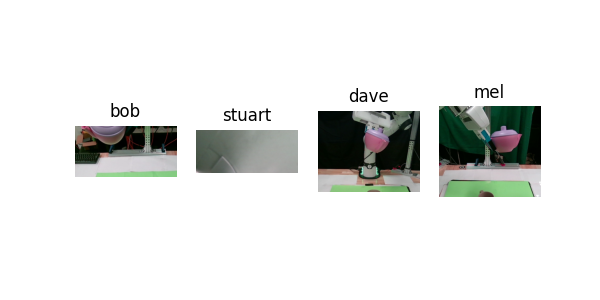

In [9]:
#Get Child Crops
crop_size = 150

for name in camera_names:
    corners_2d, _ = project_3d_bounding_box(init_transform, extrinsics[name], intrinsics[name], 0.4)
    center = corners_2d[-1]
    # print(name, center)

    min_x, max_x = int(center[0] - crop_size), int(center[0] + crop_size)
    min_y, max_y = int(center[1] - crop_size), int(center[1] + crop_size)

    height, width, _ = rgb_images[name].shape
    min_x, max_x, min_y, max_y = crop_to_bounds(min_x, max_x, min_y, max_y, height, width)

    crop = rgb_images[name][min_y: max_y, min_x: max_x]

    crops['child'][name] = crop
    crop_coords['child'][name] = (min_y, max_y, min_x, max_x)
    centroids['child'][name] = center

scale = 3
plt.figure(figsize=(scale * len(crops), scale))
for i, crop in enumerate(crops['child'].keys()):
    # print(crop, crops['child'][crop].shape)
    plt.subplot(1, len(crops['child'].keys()), 1 + i)
    plt.title(crop)
    plt.imshow(crops['child'][crop])
    plt.axis("off")
    
# child_object = "mug"
# crop_size = 125
# for name in camera_names:
#   image = Image.fromarray(rgb_images[name])

#   inputs = owl_processor(text=[child_object], images=image, return_tensors="pt")
#   # inputs = {key: val.to("cuda") for key, val in inputs.items()}  # Running out of GPU memory.

#   outputs = owl_model(**inputs)

#   target_sizes = torch.tensor([image.size[::-1]])
#   threshold = 0.05
#   results = owl_processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=threshold)

#   # Extract results for the first image
#   result = results[0]
#   boxes = result["boxes"]
#   scores = result["scores"]
#   labels = result["labels"]

#   # # Create a plot
#   # fig, ax = plt.subplots(1, figsize=(12, 8))
#   # ax.imshow(image)

#   # Define colors for different labels
#   colors = ["red", "blue", "green", "orange", "purple"]

#   # Draw bounding boxes and labels
#   best_score = 0
#   best_box = None

#   for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
#     if score > threshold:  # Display boxes with confidence above the threshold
#       x_min, y_min, x_max, y_max = box.tolist()
#       width, height = x_max - x_min, y_max - y_min
#       color = colors[i % len(colors)]

#       # # Create a rectangle patch
#       # rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor=color, facecolor='none')
#       # ax.add_patch(rect)

#       # # Add label and score
#       # ax.text(x_min, y_min - 10, f"{parent_object}: {score:.2f}", color=color, fontsize=12, weight='bold', backgroundcolor='white')

#       if best_score < score:
#         best_score = score
#         best_box = box

#   # # Show the plot
#   # plt.axis("off")
#   # plt.show()

#   if best_box is None:
#     # Failed to find the target object. Using the whole image.
#     min_x = 0
#     max_x = rgb_images[name].shape[1]
#     min_y = 0
#     max_y = rgb_images[name].shape[0]
#   else:
#     center = (best_box[0] + best_box[2]) / 2, (best_box[1] + best_box[3]) / 2

#     min_x, max_x = int(center[0] - crop_size), int(center[0] + crop_size)
#     min_y, max_y = int(center[1] - crop_size), int(center[1] + crop_size)

#     height, width, _ = rgb_images[name].shape
#     min_x, max_x, min_y, max_y = crop_to_bounds(min_x, max_x, min_y, max_y, height, width)

#   crop = rgb_images[name][min_y: max_y, min_x: max_x]

#   crops['child'][name] = crop
#   crop_coords['child'][name] = (min_y, max_y, min_x, max_x)
#   centroids['child'][name] = center


# scale = 3
# plt.figure(figsize=(scale * len(crops), scale))
# for i, crop in enumerate(crops['child'].keys()):
#     # print(crop, crops['child'][crop].shape)
#     plt.subplot(1, len(crops['child'].keys()), 1 + i)
#     plt.title(crop)
#     plt.imshow(crops['child'][crop])
#     plt.axis("off")

{'bob': {'cup': [], 'handle': [], 'body': [], 'spout': [], 'lid': []}, 'stuart': {'cup': [], 'handle': [], 'body': [], 'spout': [], 'lid': []}, 'dave': {'cup': [[104, 167], [110, 215], [123, 216], [126, 197], [123, 169]], 'handle': [[142, 171], [150, 185], [142, 193]], 'body': [], 'spout': [], 'lid': []}, 'mel': {'cup': [], 'handle': [], 'body': [], 'spout': [], 'lid': []}}


RadioButtons(options=('body', 'spout', 'lid', 'gripper'), value='body')

RadioButtons(options=('mel',), value='mel')

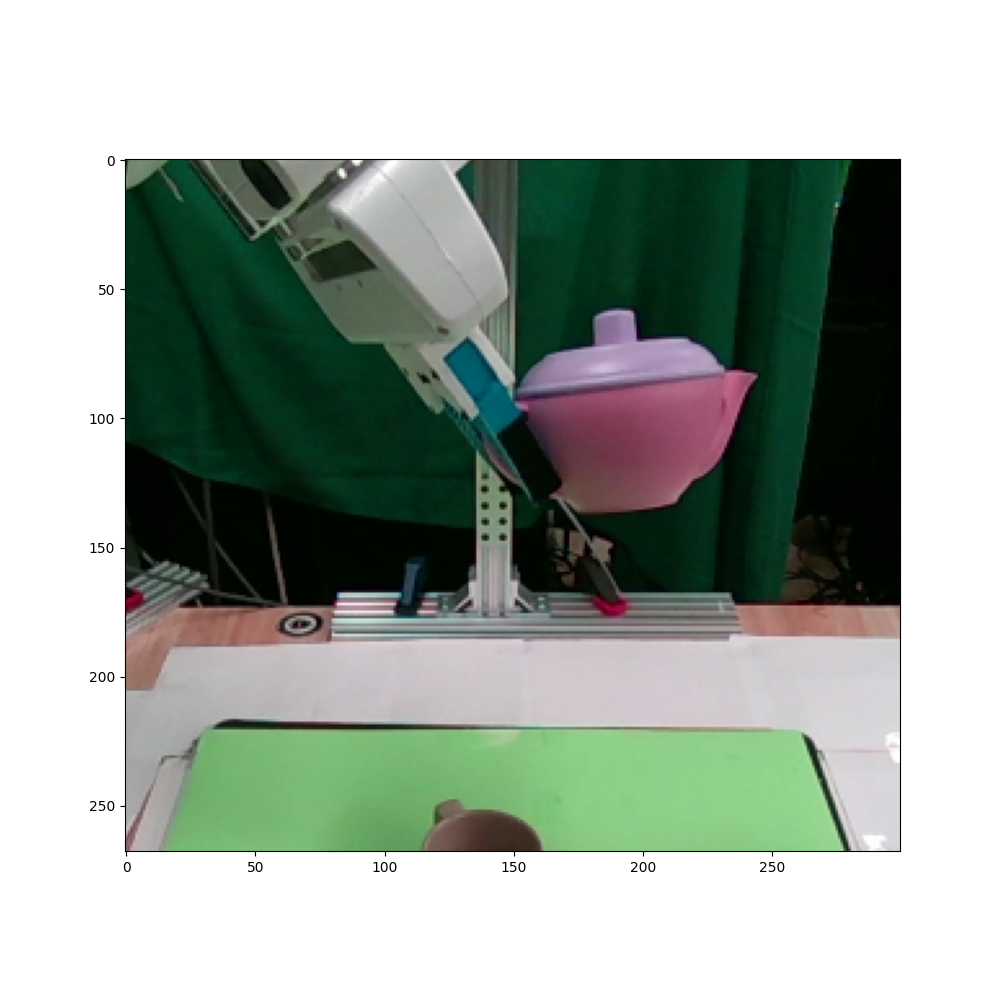

Coordinates: x=171, y=100
Coordinates: x=184, y=127
Coordinates: x=201, y=126
Coordinates: x=220, y=97
Coordinates: x=226, y=117
Coordinates: x=231, y=106
Coordinates: x=235, y=85
Coordinates: x=167, y=81
Coordinates: x=193, y=77
Coordinates: x=212, y=76
Coordinates: x=191, y=66
Coordinates: x=164, y=122
Coordinates: x=147, y=102
Coordinates: x=130, y=80
Coordinates: x=113, y=85
Coordinates: x=124, y=96


In [ ]:
%matplotlib widget
#Child point selection

# all_image_points = {camera_name: {part:[] for part in all_part_names} for camera_name in camera_names}
# gripper_points = {camera_name: [] for camera_name in camera_names}

print(all_image_points)
gui = ClickSegGui()
gui.plot_map_with_points(all_image_points, gripper_points, [child_demo_camera], child_part_names, crops['child'])

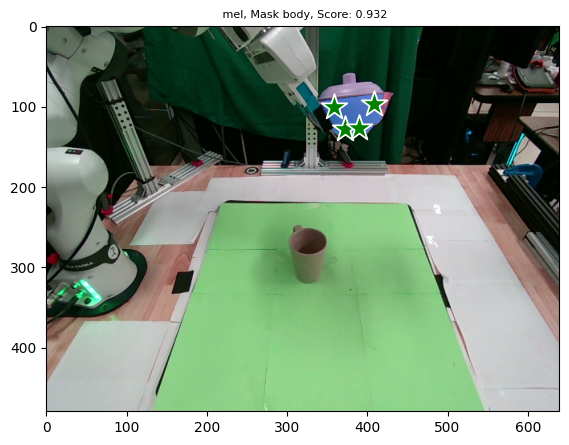

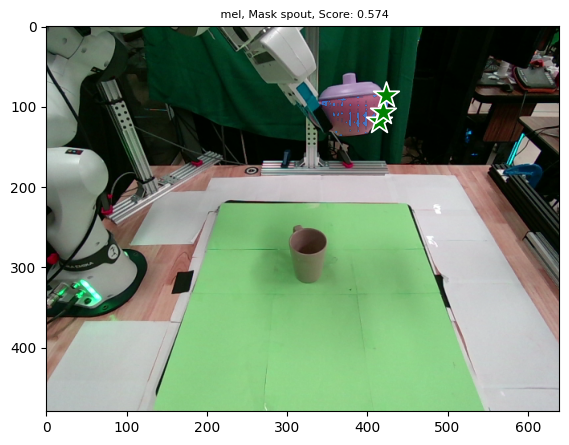

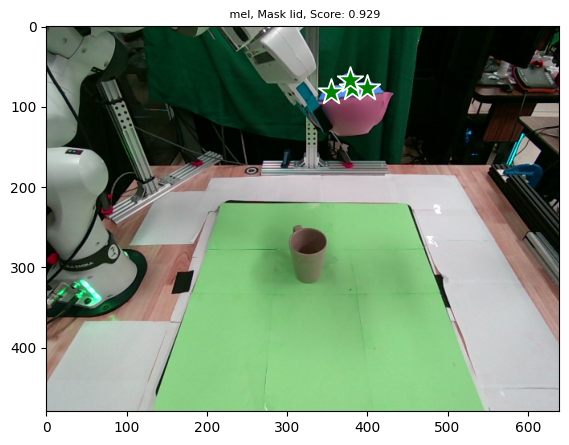

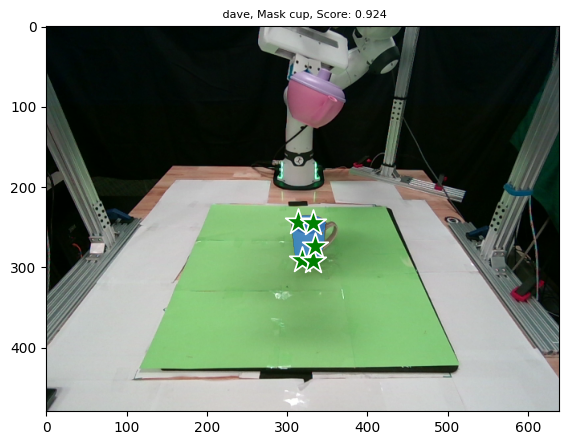

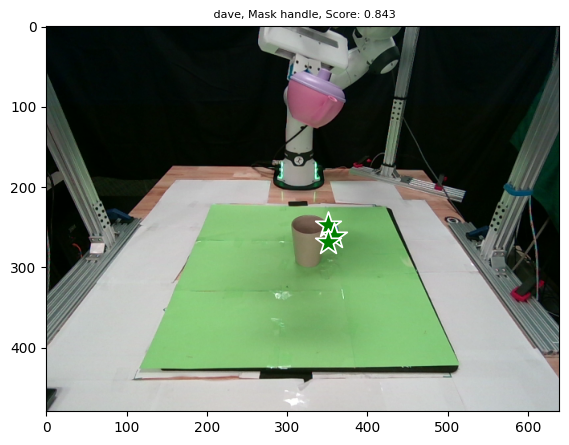

In [11]:
%matplotlib inline

# Get segmentation masks for the demo view.
mask_points, mask_labels, mask_masks, mask_scores, sam_embeddings = {},{},{},{},{}
for dict_starter in [mask_points, mask_labels, mask_masks, mask_scores, sam_embeddings]:
    dict_starter.update({key: {name: {} for name in camera_names} for key in ["child", "parent"]})

for obj in ["child", "parent"]:
  for camera in [eval(f'{obj}_demo_camera')]:
      for part in eval(f'{obj}_part_names'):
          mask_points[obj][camera][part] = np.array(all_image_points[camera][part])
          mask_labels[obj][camera][part] = np.ones(mask_points[obj][camera][part].shape[0], dtype=int)

for obj in ['child', 'parent']:
    for masked_part in eval(f'{obj}_part_names'):
        #print("masked_part", masked_part)
        seg_points = []
        seg_labels = []
        seg_points += list(mask_points[obj][eval(f'{obj}_demo_camera')][masked_part])
        seg_labels += list(mask_labels[obj][eval(f'{obj}_demo_camera')][masked_part])
        for other_part in eval(f'{obj}_part_names'):
            if masked_part == other_part:
                continue
            #print("other_part", other_part)
            seg_points += list(mask_points[obj][eval(f'{obj}_demo_camera')][other_part])
            seg_labels += list(np.zeros(mask_points[obj][eval(f'{obj}_demo_camera')][other_part].shape[0], dtype=int))

        if len(seg_points) == 0:
            mask_masks[obj][eval(f'{obj}_demo_camera')][masked_part], mask_scores[obj][eval(f'{obj}_demo_camera')][masked_part], sam_embeddings[obj][eval(f'{obj}_demo_camera')][masked_part] = [], [], [],
        else:
            seg_points += list(np.array(gripper_points[eval(f'{obj}_demo_camera')]))
            seg_labels += list(np.zeros(np.array(gripper_points[eval(f'{obj}_demo_camera')]).shape[0], dtype=int))

            seg_points = trans_points_crop_to_full(seg_points, crop_coords[obj][eval(f'{obj}_demo_camera')][2], crop_coords[obj][eval(f'{obj}_demo_camera')][0])

            mask_masks[obj][eval(f'{obj}_demo_camera')][masked_part], mask_scores[obj][eval(f'{obj}_demo_camera')][masked_part], sam_embeddings[obj][eval(f'{obj}_demo_camera')][masked_part] = segment(
                sam_predictor,
                rgb_images[eval(f'{obj}_demo_camera')],#crops[obj][eval(f'{obj}_demo_camera')]
                np.array(seg_points),
                np.array(seg_labels),
                multimask_flag=False
            )
if not whole:
    mask_masks["parent"][eval(f'{obj}_demo_camera')]["cup"] = np.bitwise_and(mask_masks["parent"][eval(f'{obj}_demo_camera')]["cup"], np.bitwise_not(mask_masks["parent"][eval(f'{obj}_demo_camera')]["handle"]))
# mask_masks["parent"][eval(f'{obj}_demo_camera')]["cup"] = np.bitwise_and(mask_masks["parent"][demo_camera]["cup"], 
#                                                           np.bitwise_not(mask_masks["child"][demo_camera]["whole_bowl"]))
# mask_masks["parent"][eval(f'{obj}_demo_camera')]["handle"] = np.bitwise_and(mask_masks["parent"][demo_camera]["handle"], 
#                                                           np.bitwise_not(mask_masks["child"][demo_camera]["whole_bowl"]))


#mask_masks["parent"][demo_camera]["cup"][mask_masks["parent"][demo_camera]["cup"]<0] = 0 
demo_points, demo_labels, demo_masks, demo_scores = mask_points, mask_labels, mask_masks, mask_scores
## Visualize masks
for obj in ['child', 'parent']:
    for part in eval(f'{obj}_part_names'):
        scale = 5
        plt.figure(figsize=(scale * len(crops), scale))
        for i, camera_name in enumerate([eval(f'{obj}_demo_camera')]):
            for j, (mask, score) in enumerate(zip(mask_masks[obj][camera_name][part], mask_scores[obj][camera_name][part])):
                # plt.subplot(1, len(camera_names), 1 + i)
                # plt.axis('off')
                plt.imshow(rgb_images[camera_name])
                #plt.imshow(crops[obj][camera_name])
                show_mask(mask, plt.gca())
                plt.title(f" {camera_name}, Mask {part}, Score: {score:.3f}", fontsize=8)
                try:
                    show_points(trans_points_crop_to_full(mask_points[obj][camera_name][part],
                                                           crop_coords[obj][camera_name][2], 
                                                           crop_coords[obj][camera_name][0]),
                                                           mask_labels[obj][camera_name][part], plt.gca())
                    # show_points(mask_points[obj][camera_name][part],
                    #             mask_labels[obj][camera_name][part], 
                    #             plt.gca())
                except IndexError: #part is not visible in some views
                    continue
                
plt.show()


In [12]:
torch.cuda.empty_cache()  # Doesn't really help.

# Take points from one view. Find the object parts in other views.
demo_img_features = {"child": None, "parent": None}
demo_img_metadata = {"child": None, "parent": None}
test_img_features = {"child": {}, "parent": {}}
test_img_metadata = {"child": {}, "parent": {}}

# Get features for demo image crop from a single camera.
for obj in ["child", "parent"]:
  demo_img = crops[obj][eval(f'{obj}_demo_camera')]
  demo_img_tensor, demo_img_grid_size, demo_img_resize_scale = dm.prepare_image(demo_img)
  demo_img_features[obj] = dm.extract_features(demo_img_tensor)
  demo_img_metadata[obj] = {"grid_size": demo_img_grid_size, "resize_scale": demo_img_resize_scale}

# Get features for test image crops from multiple cameras.
for obj in ["child", "parent"]:
  for camera in camera_names:
    if camera == eval(f'{obj}_demo_camera'):
      continue
    test_img = crops[obj][camera]
    test_img_tensor, test_img_grid_size, test_img_resize_scale = dm.prepare_image(test_img)
    test_img_features[obj][camera] = dm.extract_features(test_img_tensor)
    test_img_metadata[obj][camera] = {"grid_size": test_img_grid_size, "resize_scale": test_img_resize_scale}

In [13]:
# Flatten segmentation masks.
resized_demo_masks = {"child": {}, "parent": {}}

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    resized_demo_masks[obj][part] = dm.prepare_mask(
      trans_mask_full_to_crop(mask_masks[obj][eval(f'{obj}_demo_camera')][part][0], *crop_coords[obj][eval(f'{obj}_demo_camera')]),
      demo_img_metadata[obj]["grid_size"],
      demo_img_metadata[obj]["resize_scale"]
    )
# resized_demo_masks[obj][part] = dm.prepare_mask(
#       trans_mask_full_to_crop(mask_masks[obj][eval(f'{obj}_demo_camera')][part][0], *crop_coords[obj][camera_name]),
#       demo_img_metadata[obj]["grid_size"],
#       demo_img_metadata[obj]["resize_scale"]
#     )

INFO - 2025-01-15 06:14:47,738 - seed - Seed set to 0
INFO - 2025-01-15 06:14:47,771 - seed - Seed set to 0
INFO - 2025-01-15 06:14:47,864 - seed - Seed set to 0


(2544, 1536)
(98, 1536)


INFO - 2025-01-15 06:14:48,021 - seed - Seed set to 0
INFO - 2025-01-15 06:14:48,049 - seed - Seed set to 0
INFO - 2025-01-15 06:14:48,131 - seed - Seed set to 0
INFO - 2025-01-15 06:14:48,226 - seed - Seed set to 0


(2544, 1536)
(29, 1536)


INFO - 2025-01-15 06:14:48,293 - seed - Seed set to 0
INFO - 2025-01-15 06:14:48,483 - seed - Seed set to 0


(2544, 1536)
(44, 1536)


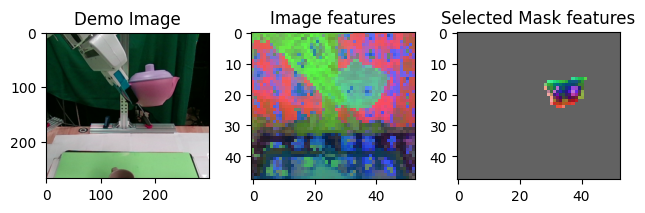

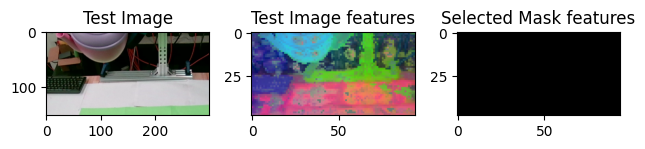

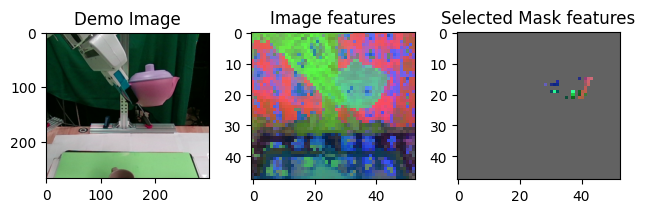

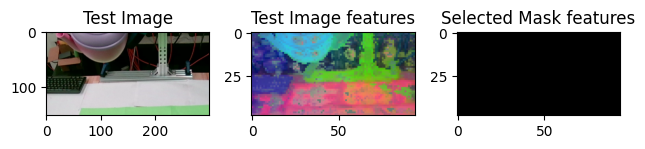

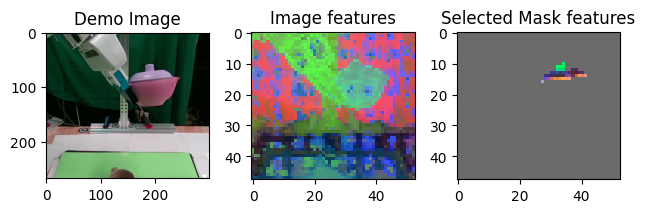

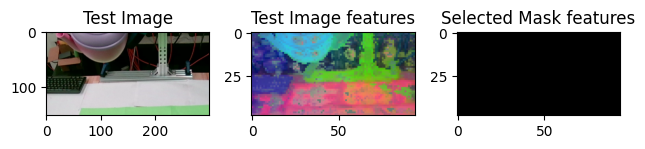

INFO - 2025-01-15 06:14:48,944 - seed - Seed set to 0
INFO - 2025-01-15 06:14:48,965 - seed - Seed set to 0
INFO - 2025-01-15 06:14:49,029 - seed - Seed set to 0
INFO - 2025-01-15 06:14:49,119 - seed - Seed set to 0
INFO - 2025-01-15 06:14:49,157 - seed - Seed set to 0


(2304, 1536)
(82, 1536)
(2304, 1536)
(13, 1536)


INFO - 2025-01-15 06:14:49,242 - seed - Seed set to 0


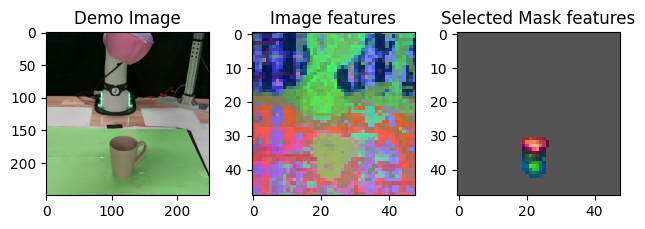

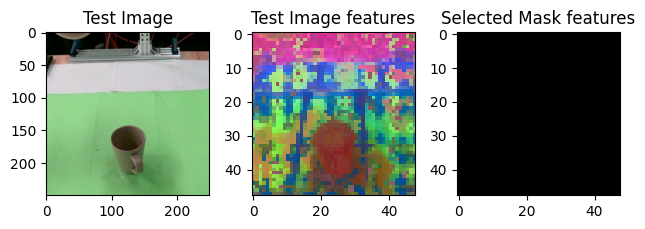

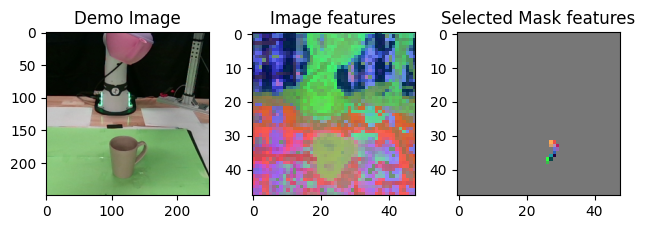

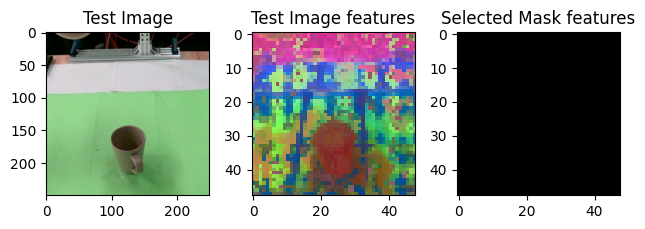

In [14]:
# Show DINOv2 features.
obj = "child"
viz_camera = "bob"

np.savez(f"{root_file}/masks_and_features", demo_img_features=demo_img_features, demo_img_metadata=demo_img_metadata, demo_masks=resized_demo_masks)

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    # Visualization
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3,)# figsize=(15,20))
    ax1.title.set_text("Demo Image")
    #ax1.title.set_fontsize(40)
    ax1.imshow(crops[obj][eval(f'{obj}_demo_camera')])
    image_feat_viz = dm.get_embedding_visualization(demo_img_features[obj], demo_img_metadata[obj]["grid_size"])
    mask_feat_viz = dm.get_embedding_visualization(demo_img_features[obj], demo_img_metadata[obj]["grid_size"], resized_demo_masks[obj][part])
    ax2.imshow(image_feat_viz)
    ax2.title.set_text("Image features")
    #ax2.title.set_fontsize(40)
    ax3.imshow(mask_feat_viz)
    ax3.title.set_text("Selected Mask features")
    #ax3.title.set_fontsize(40)
    fig.tight_layout()

    #visualize the test image and the extracted features
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, )#figsize=(15,20))
    ax1.imshow(crops[obj][viz_camera])
    ax1.title.set_text("Test Image")
    #ax1.title.set_fontsize(40)
    ax2.imshow(crops[obj][viz_camera])
    test_image_feat_viz = dm.get_embedding_visualization(test_img_features[obj][viz_camera], test_img_metadata[obj][viz_camera]["grid_size"])
    ax2.imshow(test_image_feat_viz)
    ax2.title.set_text("Test Image features")
    #ax2.title.set_fontsize(40)
    ax3.imshow(np.zeros_like(test_image_feat_viz))
    ax3.title.set_text("Selected Mask features")
    #ax3.title.set_fontsize(40)
    fig.tight_layout()

  plt.show()

 

In [15]:
# V4: match between images using the background-to-object nearest neighbor ratio.
from sklearn.neighbors import NearestNeighbors
from collections import defaultdict
from scipy.ndimage import binary_dilation

def grow_mask(mask, iterations=1, kernel_size=3):
    """Grows a segmentation mask."""
    structure = np.ones((kernel_size, kernel_size), dtype=bool)
    return binary_dilation(mask, structure=structure, iterations=iterations)

universal_threshold = 0.9
ratio_thresholds = {"child": {"cup": universal_threshold, "handle": universal_threshold}, "parent": {"trunk": universal_threshold, "branch": universal_threshold}}
ratio_thresholds = {"child": {part: universal_threshold for part in child_part_names},
                    "parent": {part: universal_threshold for part in parent_part_names}}
run_grow_mask = True

distances = {"child": defaultdict(dict), "parent": defaultdict(dict)}
match2to1 = {"child": defaultdict(dict), "parent": defaultdict(dict)}
for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    # Build knn using features from demo image, and query all features from test image
    mask_ft = demo_img_features[obj][resized_demo_masks[obj][part]]
    mask_ft = mask_ft / np.linalg.norm(mask_ft, axis=-1, keepdims=True)

    tmp = resized_demo_masks[obj][part].reshape(demo_img_metadata[obj]["grid_size"])
    if run_grow_mask:
      # Exclude object edges from the background features.
      tmp = grow_mask(tmp)
    tmp = np.logical_not(tmp).reshape(-1)
    # print(obj, part)
    # plt.figure()
    # plt.imshow(tmp)
    # plt.show()

    background_ft = demo_img_features[obj][tmp]
    background_ft = background_ft / np.linalg.norm(background_ft, axis=-1, keepdims=True)

    n = 10
    # Cannot have more nearest neighbor that total training points.
    n = min(n, len(mask_ft))
    mask_knn = NearestNeighbors(n_neighbors=n)
    background_knn = NearestNeighbors(n_neighbors=n)


    mask_knn.fit(mask_ft)
    background_knn.fit(background_ft)

    for camera in camera_names:
      if camera == eval(f'{obj}_demo_camera'):
        continue

      test_ft = test_img_features[obj][camera]
      test_ft = test_ft / np.linalg.norm(test_ft, axis=-1, keepdims=True)

      mask_d, mask_m = mask_knn.kneighbors(test_ft)
      background_d, background_m = background_knn.kneighbors(test_ft)

      # Find matches where a point is close to the object feature but far from the background feature.
      # TODO: mean could be replaced with min/max/median.
      ratio = np.mean(mask_d, axis=-1) / np.mean(background_d, axis=-1)
      happy = ratio < ratio_thresholds[obj][part]
      happy_ind = np.where(happy)[0]
      # print(happy_ind)

      # Assume points with this distance will be filtered out later.
      mask_d[np.logical_not(happy)] = 1000.0

      distances[obj][part][camera] = mask_d[:, :1]
      match2to1[obj][part][camera] = mask_m[:, :1]

      # distances[obj][part][camera], match2to1[obj][part][camera] = knn.kneighbors(tmp) #find neighbour for each demo feature in test image and the distance
      match2to1[obj][part][camera] = np.array(match2to1[obj][part][camera])  # match2to1 is the index of the closest feature in demo_image for each feature in test_image

      # plt.figure()
      # plt.plot(sorted(distances[obj][part][camera]))
      # plt.xlabel('Test image feature index')
      # plt.ylabel('Distance to nearest neighbor in Demo image')
      # plt.title('Nearest neighbor distances')
      # plt.show()

matches_info = {"child": defaultdict(dict), "parent": defaultdict(dict)}
# threshold = 10.0
threshold = 100.0

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    for camera in camera_names:
      if camera == eval(f'{obj}_demo_camera'):
        continue

      matches_info[obj][camera][part] = []

      for test_feature_idx, (dist, demo_feature_idx) in enumerate(zip(distances[obj][part][camera], match2to1[obj][part][camera])):
        demo_feature_idx = np.nonzero(resized_demo_masks[obj][part])[0][demo_feature_idx]
        row, col = dm.idx_to_source_position(demo_feature_idx, demo_img_metadata[obj]["grid_size"], demo_img_metadata[obj]["resize_scale"])
        xy_on_demo_image = (col, row)

        if dist > threshold:
          continue

        # if not trans_mask_full_to_crop(mask_masks[obj][demo_camera][part][0], *crop_coords[obj][demo_camera])[int(row), int(col)]:
        #   # TODO: This should never be triggered in the current implementation.
        #   continue # skip if feature we watch to visualize matching is not in the demo image mask

        row, col = dm.idx_to_source_position(test_feature_idx, test_img_metadata[obj][camera]["grid_size"], test_img_metadata[obj][camera]["resize_scale"])
        xy_on_test_image = (col, row)

        matches_info[obj][camera][part].append({"Demo_feature_idx": demo_feature_idx.item(),
                                                "Demo_coord": xy_on_demo_image,
                                                "Test_feature_idx": test_feature_idx,
                                                "Test_coord": xy_on_test_image,
                                                "Distance": dist.item()})

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


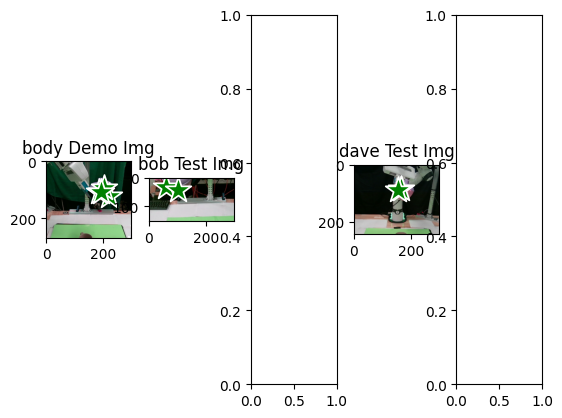

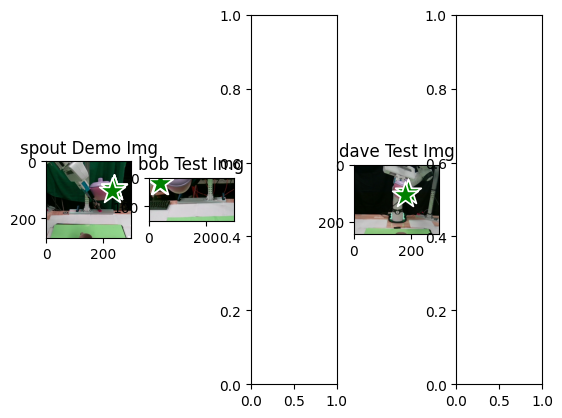

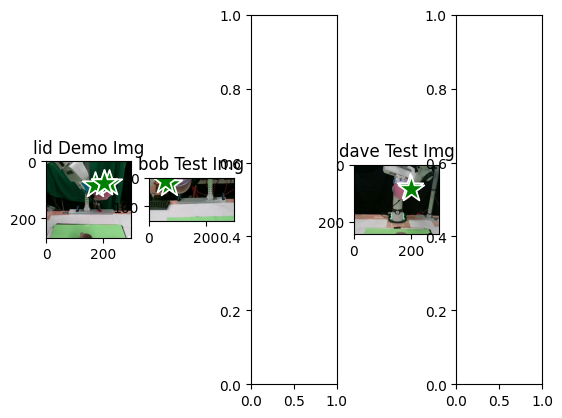

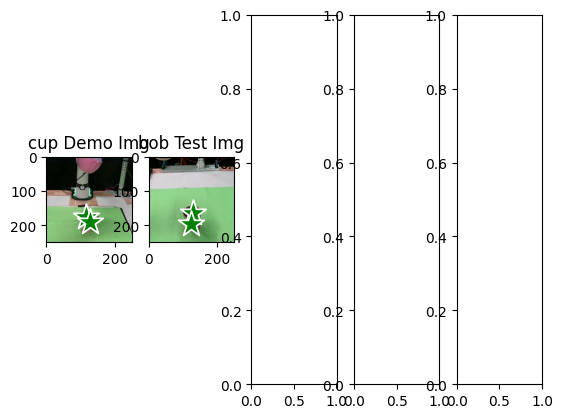

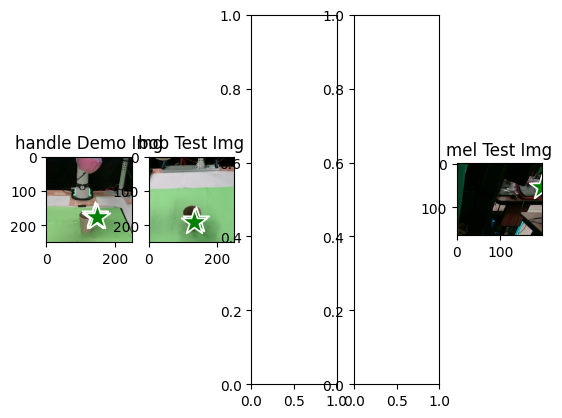

In [16]:
k = 2
top_k_demo_coords = {"child": defaultdict(dict), "parent": defaultdict(dict)}
top_k_test_coords = {"child": defaultdict(dict), "parent": defaultdict(dict)}

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    fig, ax = plt.subplots(1, len(camera_names) + 1,)
    ax[0].imshow(crops[obj][eval(f'{obj}_demo_camera')])
    ax[0].title.set_text(f"{part} Demo Img")
    for i, camera in enumerate(camera_names):
      if camera == eval(f'{obj}_demo_camera'):
        continue

      matches_info[obj][camera][part] = sorted(matches_info[obj][camera][part], key=lambda x: x["Distance"])
      top_k_matches = matches_info[obj][camera][part][:k]
      top_k_demo_coords[obj][camera][part] = np.asarray([m["Demo_coord"] for m in top_k_matches])
      top_k_test_coords[obj][camera][part] = np.asarray([m["Test_coord"] for m in top_k_matches])
      if len(top_k_demo_coords[obj][camera][part]) > 0:
        show_points(top_k_demo_coords[obj][camera][part], np.ones(top_k_demo_coords[obj][camera][part].shape[0]), ax[0])
        ax[i+1].imshow(crops[obj][camera])
        ax[i+1].title.set_text(f"{camera} Test Img")
        #ax[i+1].title.set_fontsize(40)
        show_points(top_k_test_coords[obj][camera][part], np.ones(top_k_test_coords[obj][camera][part].shape[0]), ax[i+1])


In [17]:
final_segments = {"child": defaultdict(dict), "parent": defaultdict(dict)}

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    for camera in camera_names:
      if camera == eval(f'{obj}_demo_camera'):
        continue

      if len(top_k_test_coords[obj][camera][part]) == 0:
        continue

      coords = trans_points_crop_to_full(top_k_test_coords[obj][camera][part], crop_coords[obj][camera][2], crop_coords[obj][camera][0])
      #coords = top_k_test_coords[obj][camera][part]#
      coords = coords.astype(np.int32)
      orig_coords = coords

      labels = np.ones(len(coords))
      for other_part in eval(f'{obj}_part_names'):
        if other_part == part:
          continue
        if len(top_k_test_coords[obj][camera][other_part]) == 0:
          continue
        tmp = trans_points_crop_to_full(top_k_test_coords[obj][camera][other_part], crop_coords[obj][camera][2], crop_coords[obj][camera][0])
        #tmp = top_k_test_coords[obj][camera][other_part]#
        coords = np.concatenate([coords, tmp])
        labels = np.concatenate([labels, np.zeros(len(tmp))])

      tmp_mask, tmp_score, _ = segment(sam_predictor, rgb_images[camera], coords, labels, multimask_flag=False) # #crops[obj][camera]

      # whole_mask = np.zeros_like(rgb_images[camera][:,:,0])
      # min_y, max_y, min_x, max_x = crop_coords[obj][camera]
      # whole_mask[min_y: max_y, min_x: max_x] = tmp_mask[0]
      #tmp_mask = whole_mask
      tmp_mask = tmp_mask[0]
      tmp_score = float(tmp_score[0])

      final_segments[obj][part][camera] = {"mask": tmp_mask, "score": tmp_score, "coords": orig_coords}

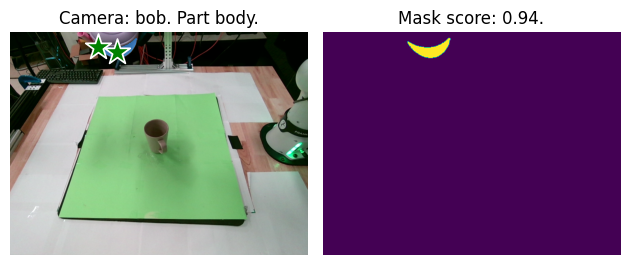

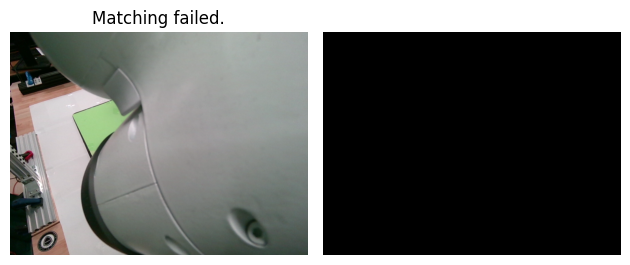

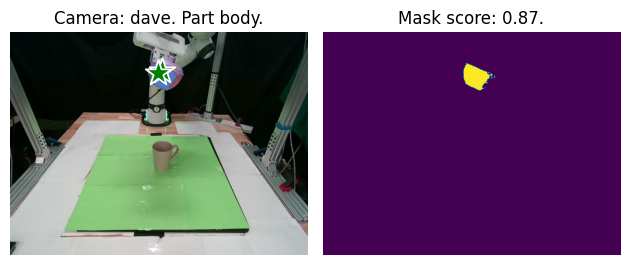

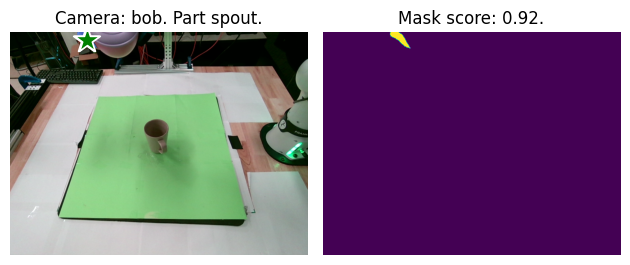

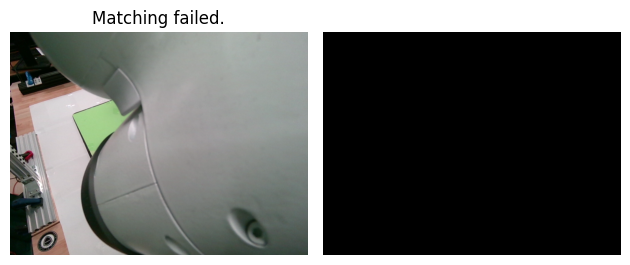

...

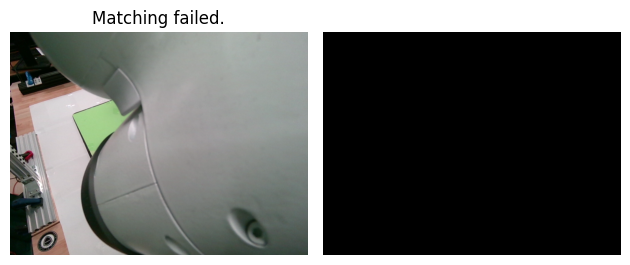

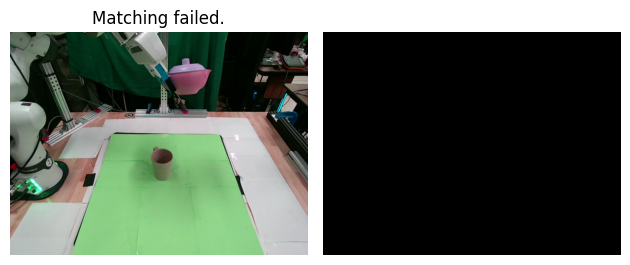

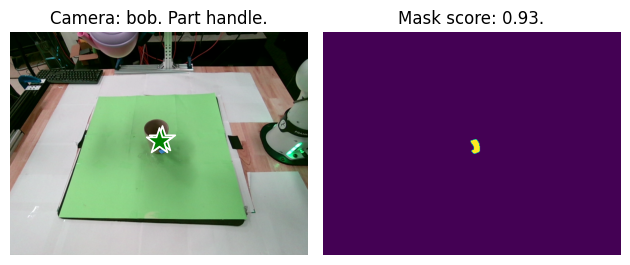

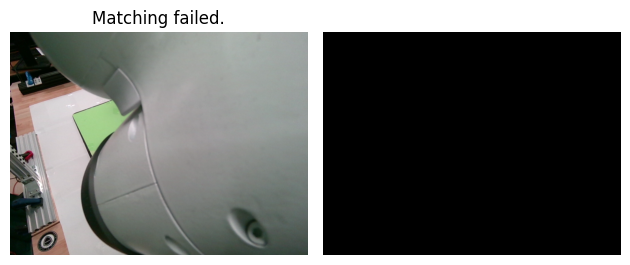

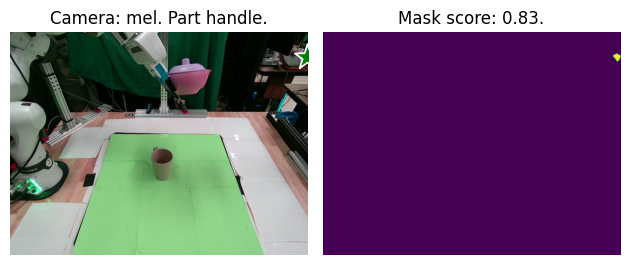

In [18]:
# Images where segmentation failed (zero matched points) will be skipped.
for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    for camera in camera_names:
      if camera == eval(f'{obj}_demo_camera'):
        continue

      fig, (ax1, ax2) = plt.subplots(1, 2,) #figsize=(10, 5))
      ax1.imshow(rgb_images[camera])
      ax1.axis("off")

      ax1.title.set_text(f"Camera: {camera}. Part {part}.")
      #ax1.title.set_fontsize(20)

      if camera in final_segments[obj][part]:
        show_mask(final_segments[obj][part][camera]["mask"], ax1)
        show_points(final_segments[obj][part][camera]['coords'], np.ones(len(final_segments[obj][part][camera]['coords'])), ax1)
        ax2.imshow(final_segments[obj][part][camera]["mask"])
      else:
        ax2.imshow(np.zeros_like(rgb_images[camera]))

      ax2.axis("off")

      if camera in final_segments[obj][part]:
        ax2.title.set_text(f"Mask score: {final_segments[obj][part][camera]['score']:.2f}.")
      else:
        ax1.title.set_text(f"Matching failed.")

      #ax2.title.set_fontsize(20)
      fig.tight_layout()

    #   from pathlib import Path
    #   save_dir = Path(f"drive/MyDrive/250103_brown/viz/{demo_name}")
    #   save_dir.mkdir(parents=True, exist_ok=True)
    #   plt.savefig(save_dir / f"test_{obj}_{part}_{camera}.png")
    #   plt.show()

In [19]:
#PCL post-processing

pcls = {camera_name: get_pointcloud_in_cam_frame(rgb_images[camera_name],
                                                 depth_images[camera_name],
                                                intrinsics[camera_name]).reshape(depth_images[camera_name].shape[0], 
                                                                                 -1, 6) for camera_name in camera_names}
masked_pcls = {part:[] for part in all_part_names}




for camera_name in ['bob', 'dave', 'stuart', 'mel']: #kevin is cut out bc i'm seeing Bad reflection issues with it:#camera_names:
    for obj in ['child', 'parent']:
        for part in eval(f'{obj}_part_names'):
            if camera_name not in final_segments[obj][part]:
                continue
            # mask = np.zeros(pcls[camera_name].shape[:2], dtype=bool)
            # min_y, max_y, min_x, max_x = crop_coords[obj][camera_name]
            # if obj == "parent":
            #     mask = mask_masks[camera_name][part][0]
            # else:
            #     mask[min_y: max_y, min_x: max_x] = mask_masks[camera_name][part]
            cloud = pcls[camera_name][final_segments[obj][part][camera_name]["mask"]==1]
            print(cloud.shape)
            if final_segments[obj][part][camera_name]['score'] > .76:
                masked_pcls[part].append(transform_cloud_to_base(cloud, extrinsics, camera_name))
    
# root_file = '/home/rthomp12/fewshot/scripts/experiment_notebooks/whole_mug_on_rack_test_20250112-175251_build_mug_flared_rack'
# save_name = f'{root_file}/init_scene_pcls.npz'
# scene_pcls = np.load(save_name)
# masked_pcls = {k: scene_pcls[k] for k in scene_pcls.keys()}
# child_part_names = ["mug"]
# parent_part_names = ["tree"]

# all_part_names = child_part_names + parent_part_names


for part in all_part_names:
    try:
        masked_pcls[part] = np.concatenate(masked_pcls[part])[:, :3]#
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] > .01]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] < .5]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] <.4]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,1] > -.35]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,1] <.5]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,0] > 0.4]
        #masked_pcls[part] = remove_outliers(masked_pcls[part], radius=.03)
        if part == 'body':
             masked_pcls[part] = remove_outliers(masked_pcls[part], radius=.01)
    except ValueError:
        continue


(1732, 6)
(642, 6)
(2620, 6)
(2333, 6)
(430, 6)
(2140, 6)
(2339, 6)
(1235, 6)
(170, 6)
Remove radius outliers: [========================================] 100%utliers: [==============================>         ] 75%


In [ ]:
camera = dict(
    eye=dict(x=1.2, y=-1.2, z=.2),
    center=dict(x=.8,y=.5,z=0)
)

#masked_pcls["cup"] = masked_pcls["cup"][masked_pcls["cup"][:,2] < 0.16]

#masked_pcls["tea_handle"] = masked_pcls["tea_handle"][masked_pcls["tea_handle"][:,1] > 0.1]

viz_utils.show_pcds_plotly({k:v for k,v in masked_pcls.items() if len(v) != 0}, camera=camera
)

: 

In [ ]:
#Save PCLs

if not whole: 
    save_name = f'{root_file}/init_scene_pcls'
    np.savez(save_name, **masked_pcls)
else:
    save_name = f'{root_file}/whole_init_scene_pcls'
    np.savez(save_name, **masked_pcls)